# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [2]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

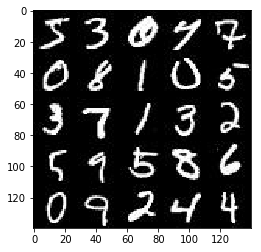

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

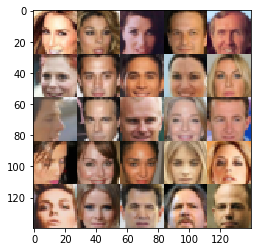

In [4]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [5]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0


/Users/darkie/anaconda/envs/dl-p3/lib/python3.6/site-packages/ipykernel_launcher.py:14: UserWarning: No GPU found. Please use a GPU to train your neural network.
  


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [10]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    inputs_r = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real')
    
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    learning_rate = tf.placeholder(tf.float32, name='learing_rate')

    return inputs_r, inputs_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [11]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    
    alpha = 0.02
    
    with tf.variable_scope('discriminator', reuse=reuse):
        
        x_1 = tf.layers.conv2d(images, 64, 5, strides=2,
                              kernel_initializer=tf.contrib.layers.xavier_initializer(), padding='same')
        relu_1 = tf.maximum(alpha * x_1, x_1)
        
        x_2 = tf.layers.conv2d(relu_1, 128, 5, strides=2,
                              kernel_initializer=tf.contrib.layers.xavier_initializer(), padding='same')
        bn_2 = tf.layers.batch_normalization(x_2, training=True)
        relu_2 = tf.maximum(alpha * bn_2, bn_2)
    
        
        x_3 = tf.layers.conv2d(relu_2, 256, 5, strides=2,
                              kernel_initializer=tf.contrib.layers.xavier_initializer(), padding='same')
        bn_3 = tf.layers.batch_normalization(x_3, training=True)
        relu_3 = tf.maximum(alpha * bn_3, bn_3)
        
        flat = tf.reshape(relu_3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [12]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    
    alpha = 0.02
    
    with tf.variable_scope('generator', reuse=not is_train):
        x_1 = tf.layers.dense(z, 7*7*512)
        
        x_1 = tf.reshape(x_1, (-1, 7, 7, 512))
        x_1 = tf.layers.batch_normalization(x_1, training=is_train)
        x_1 = tf.maximum(alpha * x_1, x_1)
        
        x_2 = tf.layers.conv2d_transpose(x_1, 256, 5, strides=2,
                                        kernel_initializer=
                                        tf.contrib.layers.xavier_initializer(), padding='same')
        x_2 = tf.layers.batch_normalization(x_2, training=is_train)
        x_2 = tf.maximum(alpha * x_2, x_2)
        
        x_3 = tf.layers.conv2d_transpose(x_2, 128, 5, strides=2,
                                        kernel_initializer=
                                        tf.contrib.layers.xavier_initializer(), padding='same')
        x_3 = tf.layers.batch_normalization(x_3, training=is_train)
        x_3 = tf.maximum(alpha * x_3, x_3)

        # output
        logits = tf.layers.conv2d_transpose(x_3, out_channel_dim, 5, strides=1,
                                            kernel_initializer=
                                            tf.contrib.layers.xavier_initializer(), padding='same')
        
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [13]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim, is_train=True)
    
    d_model_real, d_logits_real = discriminator(input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real) * 0.9))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [15]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    training_variables = tf.trainable_variables()
    
    g_variables = [var for var in training_variables if var.name.startswith('generator')]
    d_variables = [var for var in training_variables if var.name.startswith('discriminator')]

    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_variables)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_variables)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [16]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [20]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    width = data_shape[1]
    height = data_shape[2]
    image_channels = data_shape[3]
    
    input_r, input_z, lr = model_inputs(width, height, image_channels , z_dim)

    d_loss, g_loss = model_loss(input_r, input_z, image_channels)

    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    steps = 0
    print_every = 50
    show_every = 50
    steps_per_epoch = data_shape[0] // batch_size
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1
                batch_images = batch_images * 2
                
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                _ = sess.run(d_opt, feed_dict={input_r: batch_images, input_z: batch_z, lr: learning_rate})
                _ = sess.run(g_opt, feed_dict={input_r: batch_images, input_z: batch_z, lr: learning_rate})

                if steps % print_every == 0:
                    train_loss_d = d_loss.eval({input_r: batch_images, input_z: batch_z, lr: learning_rate})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    # print info
                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Step {}/{}...".format(steps - (epoch_i * steps_per_epoch), steps_per_epoch),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if steps % show_every == 0:
                    show_generator_output(sess, 25, input_z, image_channels, data_image_mode)
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Step 50/1875... Discriminator Loss: 0.5220... Generator Loss: 2.4484


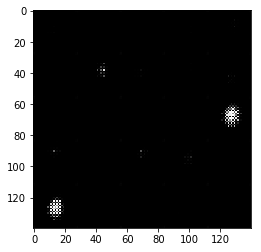

Epoch 1/2... Step 100/1875... Discriminator Loss: 0.4019... Generator Loss: 3.4563


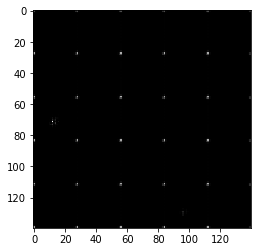

Epoch 1/2... Step 150/1875... Discriminator Loss: 1.0380... Generator Loss: 2.4831


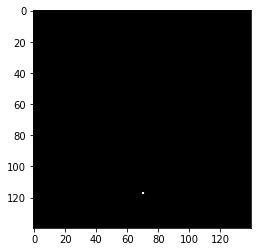

Epoch 1/2... Step 200/1875... Discriminator Loss: 0.9197... Generator Loss: 1.9167


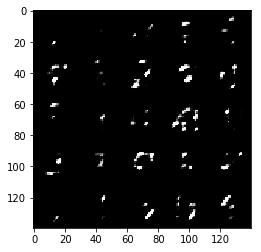

Epoch 1/2... Step 250/1875... Discriminator Loss: 0.9983... Generator Loss: 2.0447


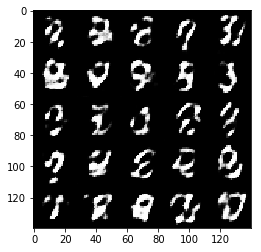

Epoch 1/2... Step 300/1875... Discriminator Loss: 1.1565... Generator Loss: 0.6944


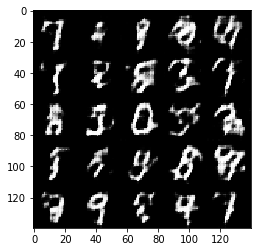

Epoch 1/2... Step 350/1875... Discriminator Loss: 1.0318... Generator Loss: 1.2458


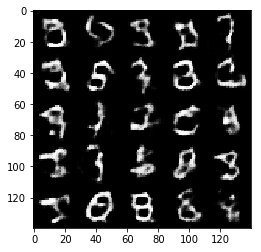

Epoch 1/2... Step 400/1875... Discriminator Loss: 1.7165... Generator Loss: 0.3850


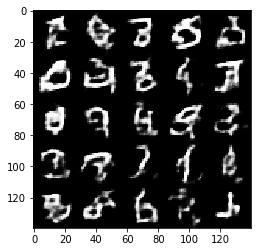

Epoch 1/2... Step 450/1875... Discriminator Loss: 0.9916... Generator Loss: 1.2034


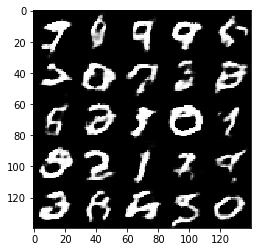

Epoch 1/2... Step 500/1875... Discriminator Loss: 1.2830... Generator Loss: 0.6449


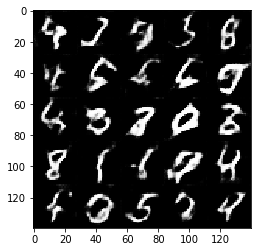

Epoch 1/2... Step 550/1875... Discriminator Loss: 1.1483... Generator Loss: 1.5273


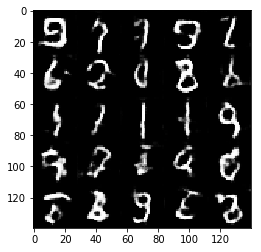

Epoch 1/2... Step 600/1875... Discriminator Loss: 0.9494... Generator Loss: 1.0805


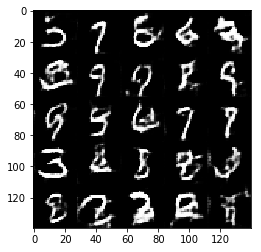

Epoch 1/2... Step 650/1875... Discriminator Loss: 1.1181... Generator Loss: 0.9522


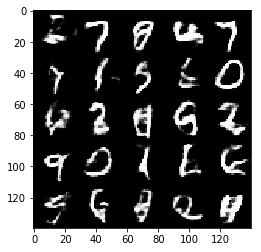

Epoch 1/2... Step 700/1875... Discriminator Loss: 1.0223... Generator Loss: 0.9815


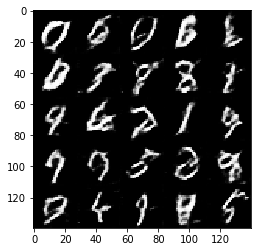

Epoch 1/2... Step 750/1875... Discriminator Loss: 0.9790... Generator Loss: 0.9296


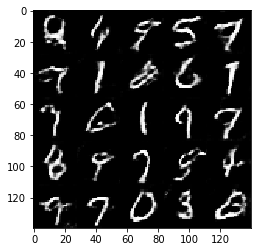

Epoch 1/2... Step 800/1875... Discriminator Loss: 1.7045... Generator Loss: 0.3513


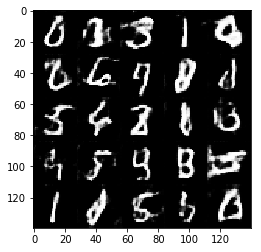

Epoch 1/2... Step 850/1875... Discriminator Loss: 1.1217... Generator Loss: 0.8577


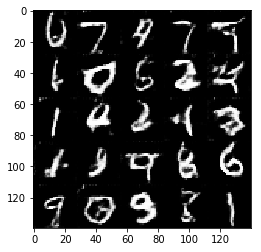

Epoch 1/2... Step 900/1875... Discriminator Loss: 0.9287... Generator Loss: 1.2447


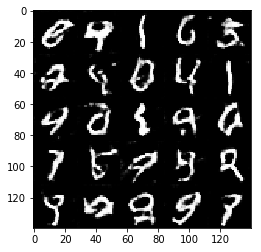

Epoch 1/2... Step 950/1875... Discriminator Loss: 1.0459... Generator Loss: 0.8952


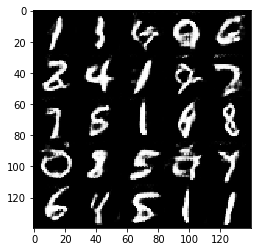

Epoch 1/2... Step 1000/1875... Discriminator Loss: 1.0754... Generator Loss: 0.9655


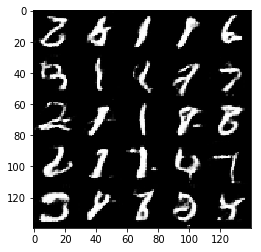

Epoch 1/2... Step 1050/1875... Discriminator Loss: 1.3859... Generator Loss: 0.5818


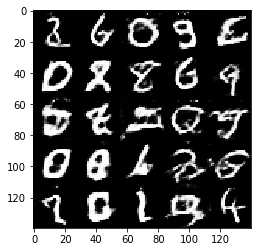

Epoch 1/2... Step 1100/1875... Discriminator Loss: 1.7894... Generator Loss: 0.3598


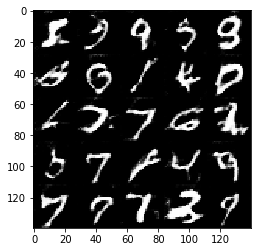

Epoch 1/2... Step 1150/1875... Discriminator Loss: 1.6372... Generator Loss: 0.3973


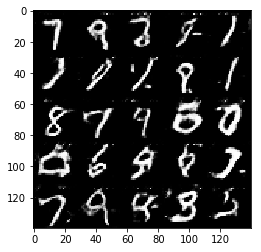

Epoch 1/2... Step 1200/1875... Discriminator Loss: 0.9607... Generator Loss: 1.6569


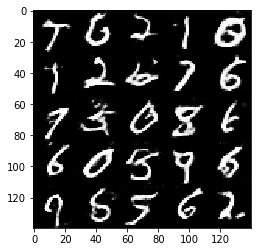

Epoch 1/2... Step 1250/1875... Discriminator Loss: 1.0120... Generator Loss: 0.9830


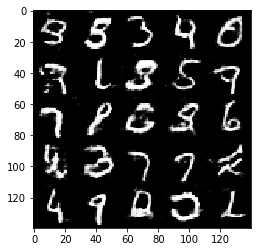

Epoch 1/2... Step 1300/1875... Discriminator Loss: 1.1238... Generator Loss: 0.9255


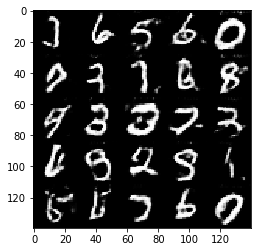

Epoch 1/2... Step 1350/1875... Discriminator Loss: 1.4158... Generator Loss: 0.5162


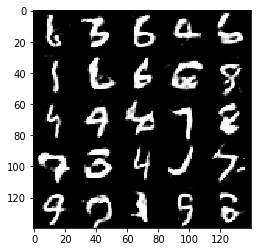

Epoch 1/2... Step 1400/1875... Discriminator Loss: 1.1511... Generator Loss: 0.7972


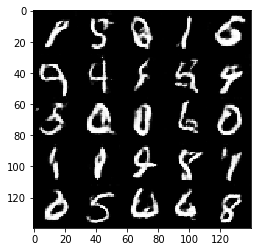

Epoch 1/2... Step 1450/1875... Discriminator Loss: 1.3838... Generator Loss: 0.7115


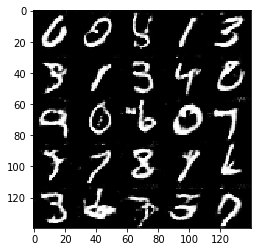

Epoch 1/2... Step 1500/1875... Discriminator Loss: 1.0828... Generator Loss: 0.7984


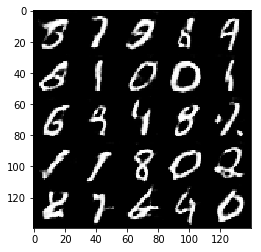

Epoch 1/2... Step 1550/1875... Discriminator Loss: 0.9761... Generator Loss: 0.9740


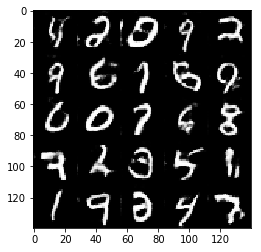

Epoch 1/2... Step 1600/1875... Discriminator Loss: 1.8750... Generator Loss: 0.4700


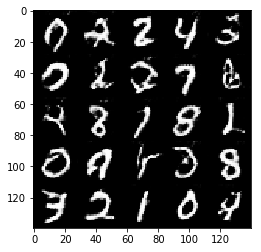

Epoch 1/2... Step 1650/1875... Discriminator Loss: 0.7746... Generator Loss: 1.3691


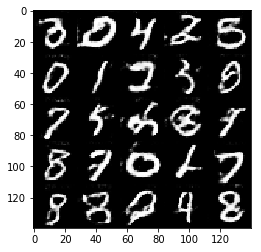

Epoch 1/2... Step 1700/1875... Discriminator Loss: 1.0056... Generator Loss: 0.8854


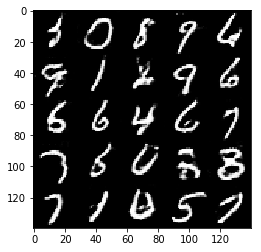

Epoch 1/2... Step 1750/1875... Discriminator Loss: 1.0519... Generator Loss: 0.8954


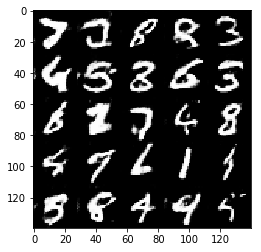

Epoch 1/2... Step 1800/1875... Discriminator Loss: 0.8168... Generator Loss: 1.4703


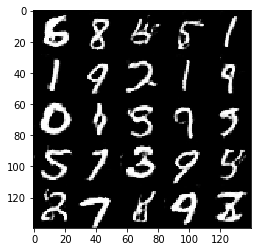

Epoch 1/2... Step 1850/1875... Discriminator Loss: 1.2389... Generator Loss: 0.6631


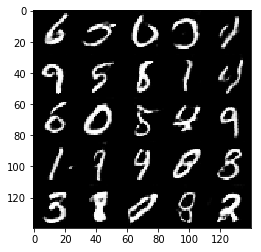

Epoch 2/2... Step 25/1875... Discriminator Loss: 0.9754... Generator Loss: 1.1823


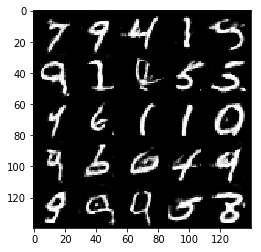

Epoch 2/2... Step 75/1875... Discriminator Loss: 0.8445... Generator Loss: 1.3205


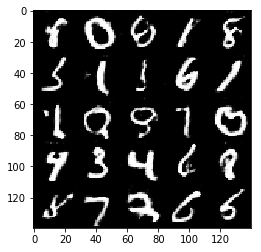

Epoch 2/2... Step 125/1875... Discriminator Loss: 1.3770... Generator Loss: 0.5906


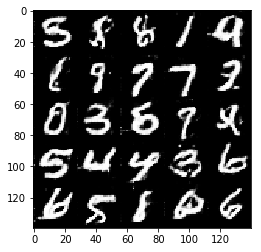

Epoch 2/2... Step 175/1875... Discriminator Loss: 0.9271... Generator Loss: 1.3595


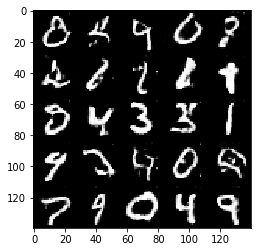

Epoch 2/2... Step 225/1875... Discriminator Loss: 1.0481... Generator Loss: 1.8660


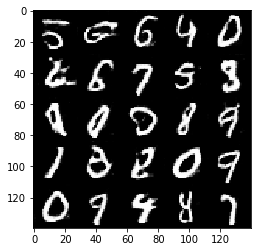

Epoch 2/2... Step 275/1875... Discriminator Loss: 1.7256... Generator Loss: 0.3547


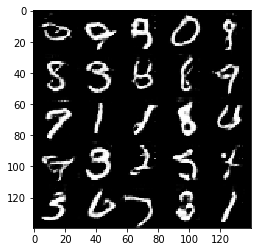

Epoch 2/2... Step 325/1875... Discriminator Loss: 1.1707... Generator Loss: 0.7713


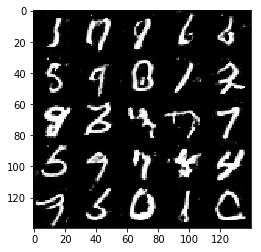

Epoch 2/2... Step 375/1875... Discriminator Loss: 0.9256... Generator Loss: 1.1535


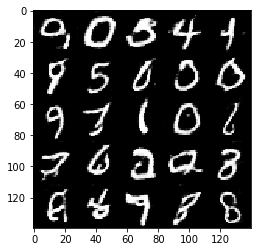

Epoch 2/2... Step 425/1875... Discriminator Loss: 0.5683... Generator Loss: 1.9303


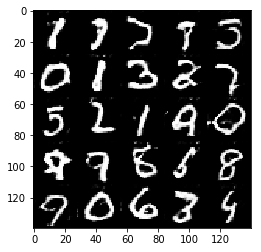

Epoch 2/2... Step 475/1875... Discriminator Loss: 0.8131... Generator Loss: 1.2086


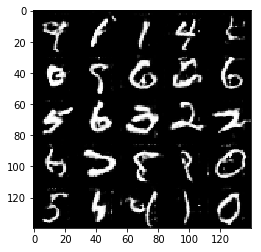

Epoch 2/2... Step 525/1875... Discriminator Loss: 1.2482... Generator Loss: 2.2693


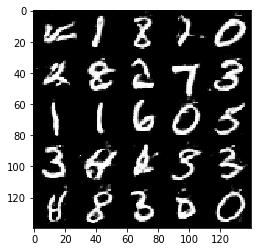

Epoch 2/2... Step 575/1875... Discriminator Loss: 1.5656... Generator Loss: 0.4698


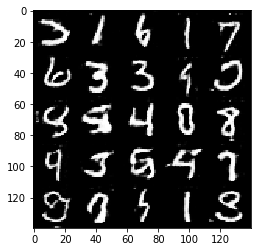

Epoch 2/2... Step 625/1875... Discriminator Loss: 1.3099... Generator Loss: 0.6455


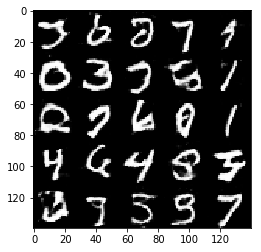

Epoch 2/2... Step 675/1875... Discriminator Loss: 1.1416... Generator Loss: 0.7977


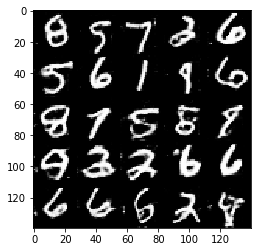

Epoch 2/2... Step 725/1875... Discriminator Loss: 1.1882... Generator Loss: 0.8335


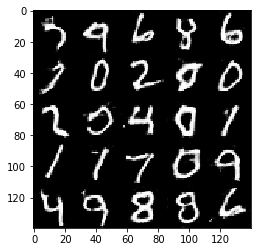

Epoch 2/2... Step 775/1875... Discriminator Loss: 0.8903... Generator Loss: 3.0314


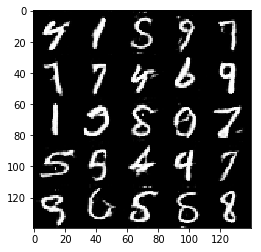

Epoch 2/2... Step 825/1875... Discriminator Loss: 1.1412... Generator Loss: 0.7267


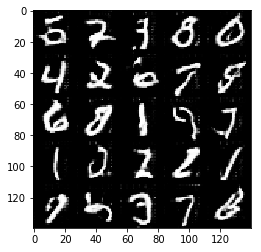

Epoch 2/2... Step 875/1875... Discriminator Loss: 0.7919... Generator Loss: 1.2032


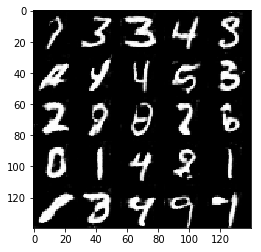

Epoch 2/2... Step 925/1875... Discriminator Loss: 0.8392... Generator Loss: 1.1739


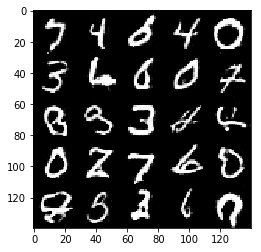

Epoch 2/2... Step 975/1875... Discriminator Loss: 0.6479... Generator Loss: 2.0830


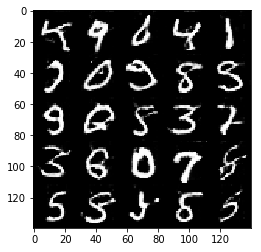

Epoch 2/2... Step 1025/1875... Discriminator Loss: 0.7820... Generator Loss: 1.1575


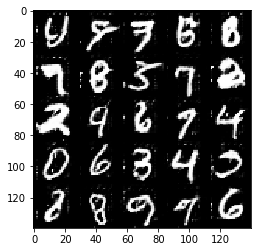

Epoch 2/2... Step 1075/1875... Discriminator Loss: 0.6152... Generator Loss: 2.0308


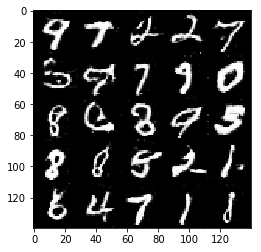

Epoch 2/2... Step 1125/1875... Discriminator Loss: 0.6020... Generator Loss: 1.7574


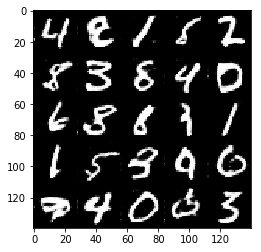

Epoch 2/2... Step 1175/1875... Discriminator Loss: 1.2896... Generator Loss: 0.7482


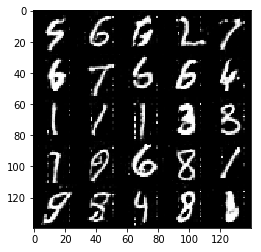

Epoch 2/2... Step 1225/1875... Discriminator Loss: 0.9062... Generator Loss: 1.1129


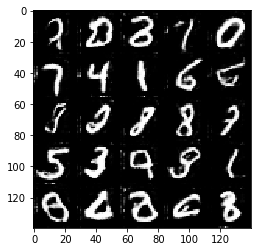

Epoch 2/2... Step 1275/1875... Discriminator Loss: 0.7511... Generator Loss: 1.6398


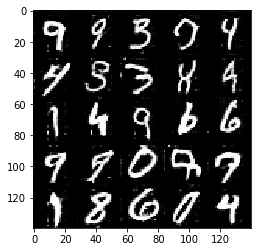

Epoch 2/2... Step 1325/1875... Discriminator Loss: 0.8376... Generator Loss: 1.2974


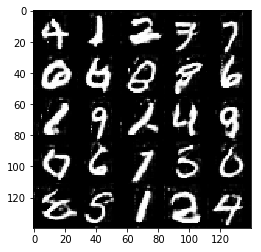

Epoch 2/2... Step 1375/1875... Discriminator Loss: 0.7339... Generator Loss: 1.3968


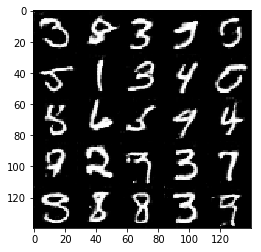

Epoch 2/2... Step 1425/1875... Discriminator Loss: 1.4543... Generator Loss: 0.5791


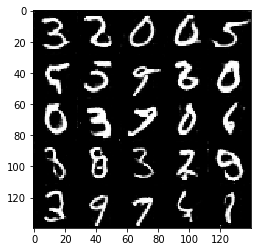

Epoch 2/2... Step 1475/1875... Discriminator Loss: 1.1304... Generator Loss: 2.1502


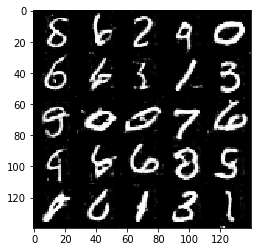

Epoch 2/2... Step 1525/1875... Discriminator Loss: 0.9268... Generator Loss: 1.0304


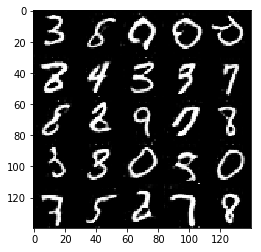

Epoch 2/2... Step 1575/1875... Discriminator Loss: 1.6502... Generator Loss: 0.4058


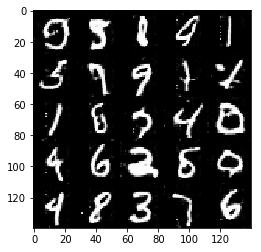

Epoch 2/2... Step 1625/1875... Discriminator Loss: 1.1673... Generator Loss: 0.7974


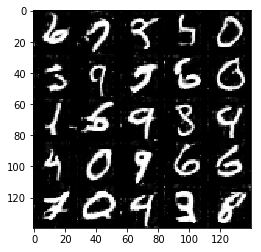

Epoch 2/2... Step 1675/1875... Discriminator Loss: 0.7451... Generator Loss: 2.2293


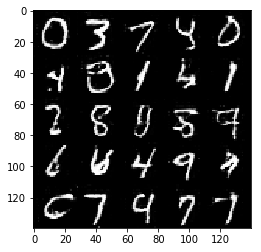

Epoch 2/2... Step 1725/1875... Discriminator Loss: 0.7567... Generator Loss: 1.3119


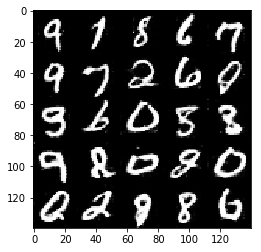

Epoch 2/2... Step 1775/1875... Discriminator Loss: 0.7299... Generator Loss: 1.4060


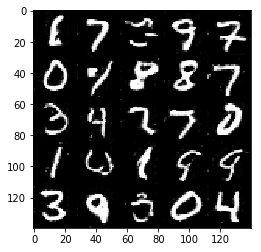

Epoch 2/2... Step 1825/1875... Discriminator Loss: 1.7997... Generator Loss: 0.3558


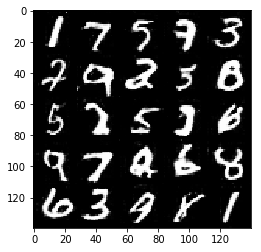

Epoch 2/2... Step 1875/1875... Discriminator Loss: 0.6437... Generator Loss: 1.6315


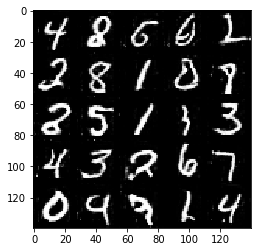

In [21]:
batch_size = 32
z_dim = 100
learning_rate = 0.001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Step 50/6331... Discriminator Loss: 0.4366... Generator Loss: 2.7354


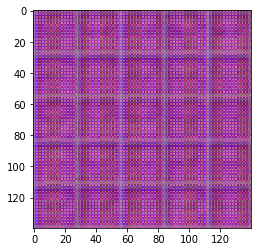

Epoch 1/1... Step 100/6331... Discriminator Loss: 0.7610... Generator Loss: 4.5524


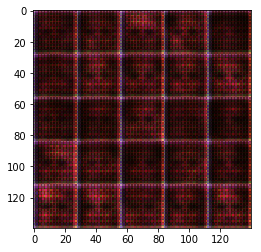

Epoch 1/1... Step 150/6331... Discriminator Loss: 0.7944... Generator Loss: 1.3658


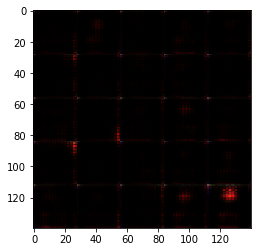

Epoch 1/1... Step 200/6331... Discriminator Loss: 0.6644... Generator Loss: 1.9926


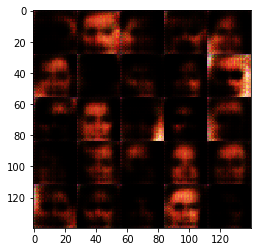

Epoch 1/1... Step 250/6331... Discriminator Loss: 1.0711... Generator Loss: 0.9725


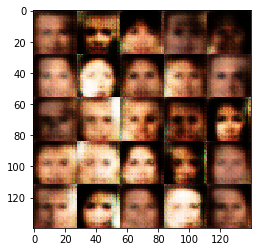

Epoch 1/1... Step 300/6331... Discriminator Loss: 1.4295... Generator Loss: 0.5148


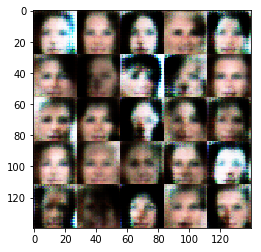

Epoch 1/1... Step 350/6331... Discriminator Loss: 1.5629... Generator Loss: 0.4846


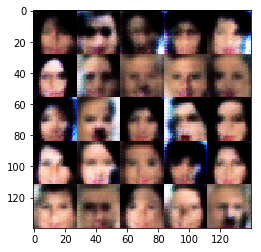

Epoch 1/1... Step 400/6331... Discriminator Loss: 1.4076... Generator Loss: 0.5402


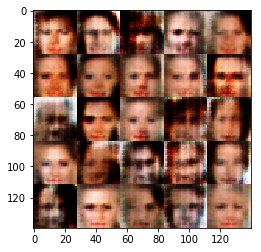

Epoch 1/1... Step 450/6331... Discriminator Loss: 1.7296... Generator Loss: 0.3717


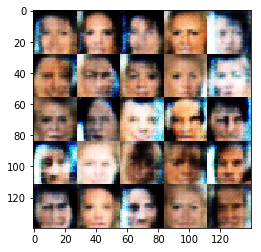

Epoch 1/1... Step 500/6331... Discriminator Loss: 1.1744... Generator Loss: 0.7125


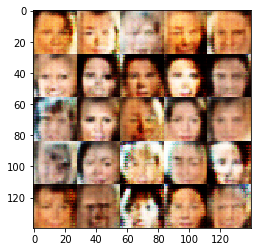

Epoch 1/1... Step 550/6331... Discriminator Loss: 1.0348... Generator Loss: 1.1600


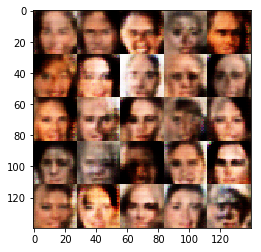

Epoch 1/1... Step 600/6331... Discriminator Loss: 1.0613... Generator Loss: 1.8044


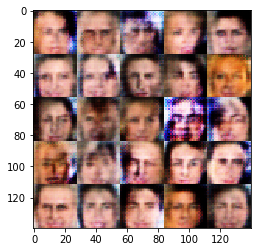

Epoch 1/1... Step 650/6331... Discriminator Loss: 0.5620... Generator Loss: 2.1247


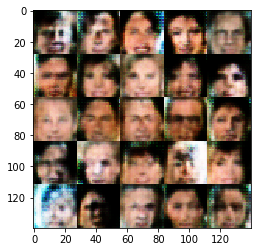

Epoch 1/1... Step 700/6331... Discriminator Loss: 0.8878... Generator Loss: 1.9904


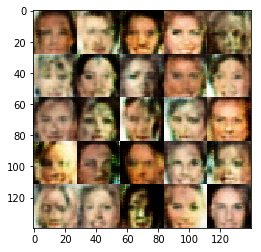

Epoch 1/1... Step 750/6331... Discriminator Loss: 0.7078... Generator Loss: 2.7720


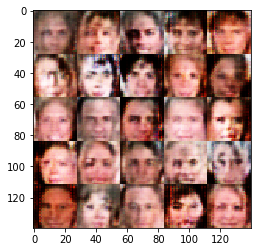

Epoch 1/1... Step 800/6331... Discriminator Loss: 0.8014... Generator Loss: 1.1885


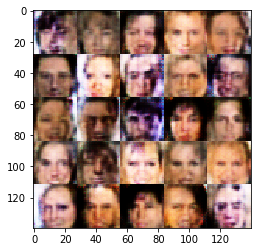

Epoch 1/1... Step 850/6331... Discriminator Loss: 1.3043... Generator Loss: 0.5905


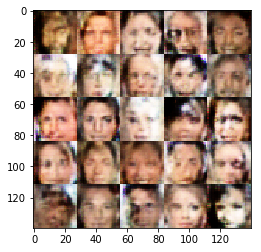

Epoch 1/1... Step 900/6331... Discriminator Loss: 1.6724... Generator Loss: 0.4004


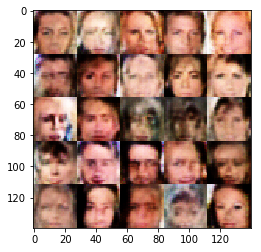

Epoch 1/1... Step 950/6331... Discriminator Loss: 1.0562... Generator Loss: 0.8654


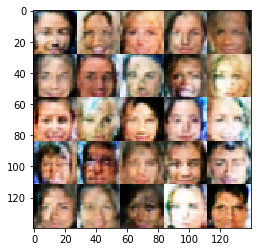

Epoch 1/1... Step 1000/6331... Discriminator Loss: 1.1701... Generator Loss: 0.7857


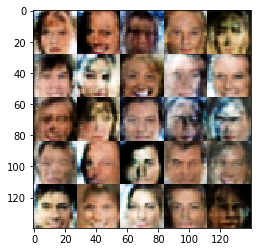

Epoch 1/1... Step 1050/6331... Discriminator Loss: 0.9256... Generator Loss: 1.1923


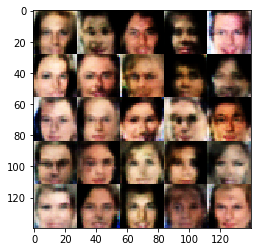

Epoch 1/1... Step 1100/6331... Discriminator Loss: 1.0925... Generator Loss: 0.8057


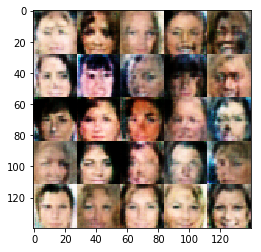

Epoch 1/1... Step 1150/6331... Discriminator Loss: 1.2667... Generator Loss: 0.8411


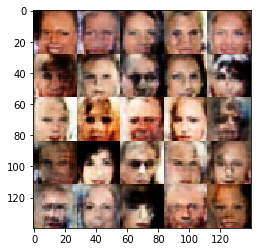

Epoch 1/1... Step 1200/6331... Discriminator Loss: 1.2000... Generator Loss: 0.6160


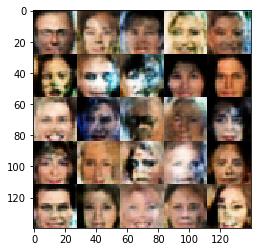

Epoch 1/1... Step 1250/6331... Discriminator Loss: 1.4731... Generator Loss: 0.6746


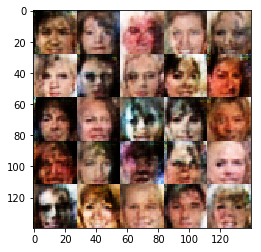

Epoch 1/1... Step 1300/6331... Discriminator Loss: 0.6864... Generator Loss: 1.4421


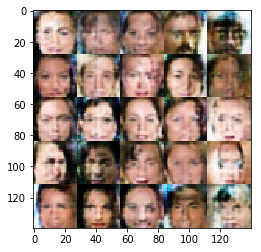

Epoch 1/1... Step 1350/6331... Discriminator Loss: 1.6856... Generator Loss: 0.4198


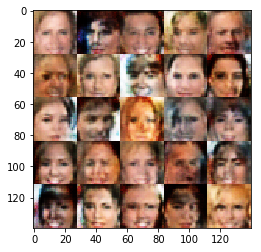

Epoch 1/1... Step 1400/6331... Discriminator Loss: 1.0488... Generator Loss: 1.0566


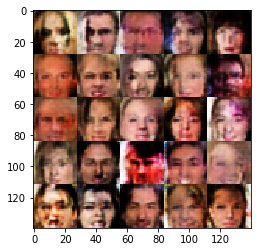

Epoch 1/1... Step 1450/6331... Discriminator Loss: 1.5382... Generator Loss: 0.5197


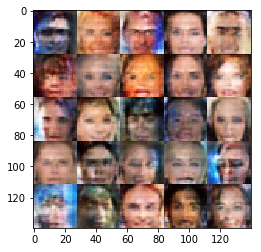

Epoch 1/1... Step 1500/6331... Discriminator Loss: 1.1562... Generator Loss: 0.8219


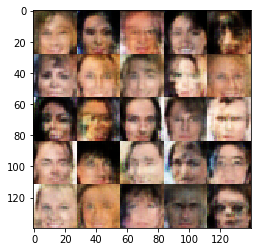

Epoch 1/1... Step 1550/6331... Discriminator Loss: 1.3086... Generator Loss: 0.9945


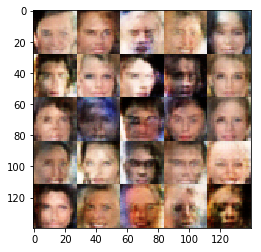

Epoch 1/1... Step 1600/6331... Discriminator Loss: 1.1779... Generator Loss: 0.8044


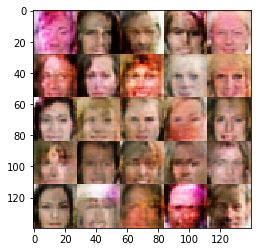

Epoch 1/1... Step 1650/6331... Discriminator Loss: 1.0722... Generator Loss: 0.7790


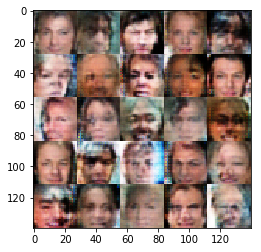

Epoch 1/1... Step 1700/6331... Discriminator Loss: 1.3526... Generator Loss: 0.7046


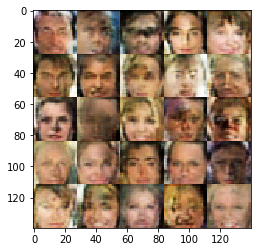

Epoch 1/1... Step 1750/6331... Discriminator Loss: 0.9651... Generator Loss: 1.1287


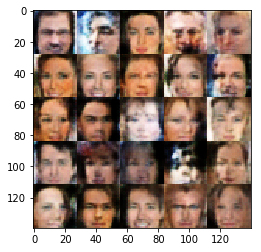

Epoch 1/1... Step 1800/6331... Discriminator Loss: 1.5215... Generator Loss: 0.5254


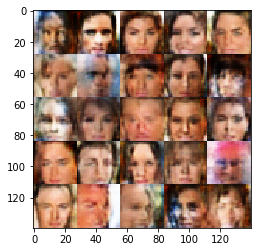

Epoch 1/1... Step 1850/6331... Discriminator Loss: 1.2471... Generator Loss: 0.6825


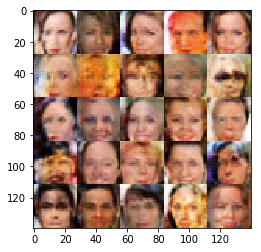

Epoch 1/1... Step 1900/6331... Discriminator Loss: 1.3521... Generator Loss: 0.6151


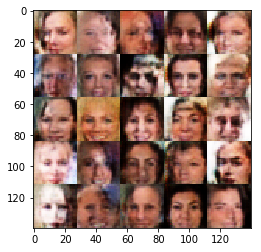

Epoch 1/1... Step 1950/6331... Discriminator Loss: 1.4483... Generator Loss: 0.7887


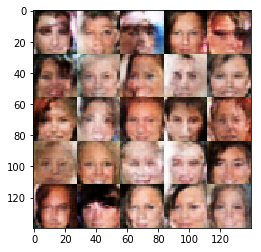

Epoch 1/1... Step 2000/6331... Discriminator Loss: 1.0899... Generator Loss: 1.1579


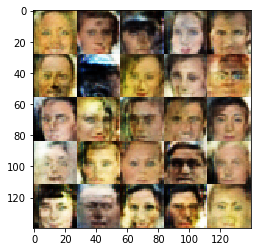

Epoch 1/1... Step 2050/6331... Discriminator Loss: 1.3010... Generator Loss: 0.7417


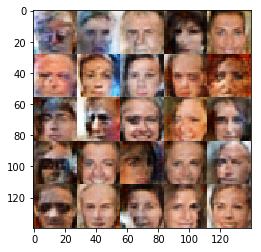

Epoch 1/1... Step 2100/6331... Discriminator Loss: 1.1682... Generator Loss: 1.2543


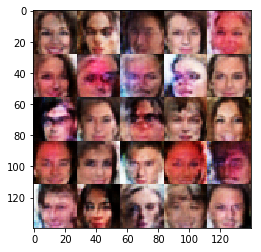

Epoch 1/1... Step 2150/6331... Discriminator Loss: 1.1308... Generator Loss: 0.9807


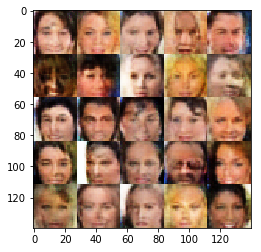

Epoch 1/1... Step 2200/6331... Discriminator Loss: 1.5785... Generator Loss: 0.4696


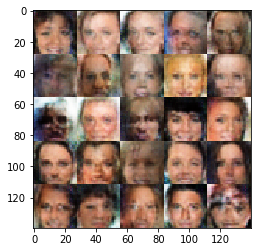

Epoch 1/1... Step 2250/6331... Discriminator Loss: 1.5462... Generator Loss: 0.5056


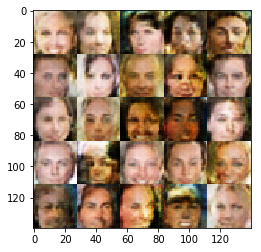

Epoch 1/1... Step 2300/6331... Discriminator Loss: 1.1639... Generator Loss: 0.8170


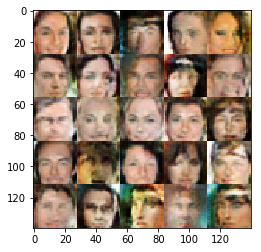

Epoch 1/1... Step 2350/6331... Discriminator Loss: 1.3021... Generator Loss: 0.7013


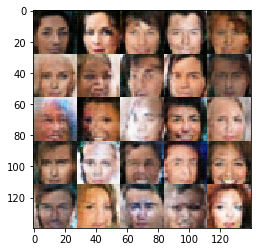

Epoch 1/1... Step 2400/6331... Discriminator Loss: 1.3556... Generator Loss: 0.6471


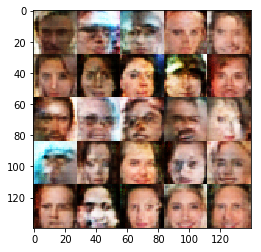

Epoch 1/1... Step 2450/6331... Discriminator Loss: 1.2488... Generator Loss: 0.6573


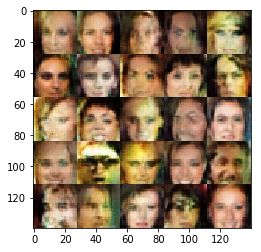

Epoch 1/1... Step 2500/6331... Discriminator Loss: 1.2079... Generator Loss: 0.7472


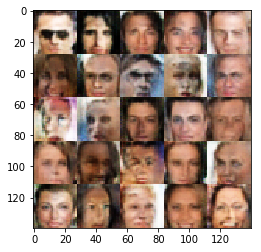

Epoch 1/1... Step 2550/6331... Discriminator Loss: 1.2396... Generator Loss: 0.7223


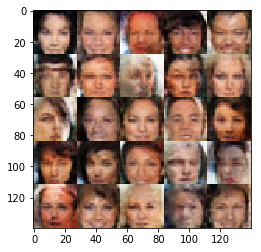

Epoch 1/1... Step 2600/6331... Discriminator Loss: 1.3414... Generator Loss: 0.5779


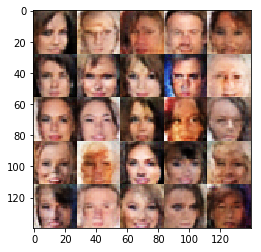

Epoch 1/1... Step 2650/6331... Discriminator Loss: 1.3269... Generator Loss: 0.5860


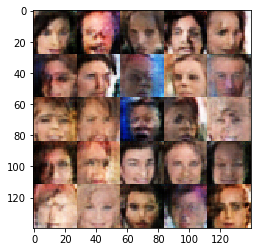

Epoch 1/1... Step 2700/6331... Discriminator Loss: 1.1481... Generator Loss: 0.8544


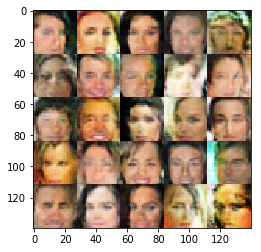

Epoch 1/1... Step 2750/6331... Discriminator Loss: 1.1971... Generator Loss: 0.8095


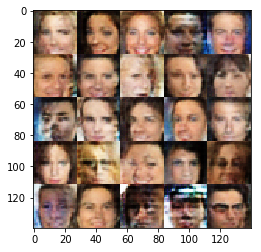

Epoch 1/1... Step 2800/6331... Discriminator Loss: 1.4734... Generator Loss: 0.5161


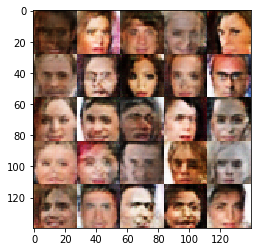

Epoch 1/1... Step 2850/6331... Discriminator Loss: 1.5201... Generator Loss: 0.4740


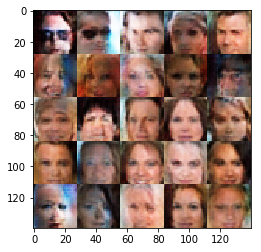

Epoch 1/1... Step 2900/6331... Discriminator Loss: 1.1842... Generator Loss: 0.7798


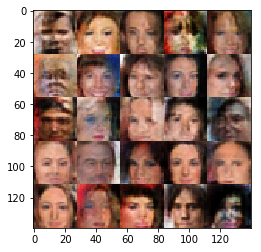

Epoch 1/1... Step 2950/6331... Discriminator Loss: 1.2173... Generator Loss: 0.7736


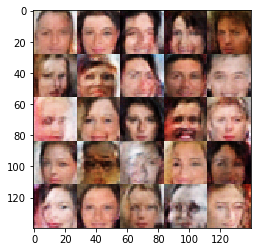

Epoch 1/1... Step 3000/6331... Discriminator Loss: 1.2843... Generator Loss: 0.6441


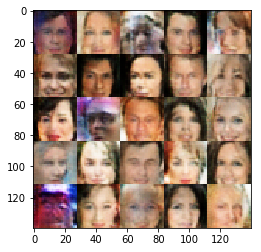

Epoch 1/1... Step 3050/6331... Discriminator Loss: 1.3149... Generator Loss: 0.7598


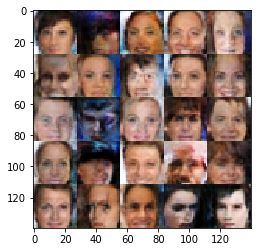

Epoch 1/1... Step 3100/6331... Discriminator Loss: 1.3143... Generator Loss: 0.6295


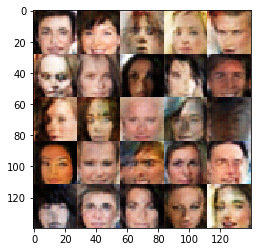

Epoch 1/1... Step 3150/6331... Discriminator Loss: 1.6095... Generator Loss: 0.4876


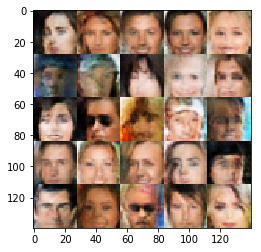

Epoch 1/1... Step 3200/6331... Discriminator Loss: 1.4771... Generator Loss: 0.5963


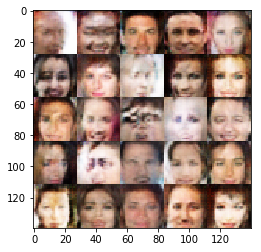

Epoch 1/1... Step 3250/6331... Discriminator Loss: 1.5516... Generator Loss: 0.5753


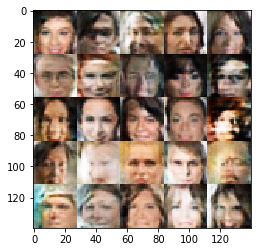

Epoch 1/1... Step 3300/6331... Discriminator Loss: 1.6315... Generator Loss: 0.4196


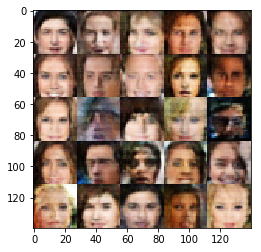

Epoch 1/1... Step 3350/6331... Discriminator Loss: 1.4295... Generator Loss: 0.4657


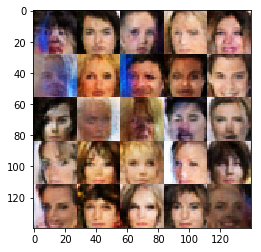

Epoch 1/1... Step 3400/6331... Discriminator Loss: 1.3863... Generator Loss: 0.6721


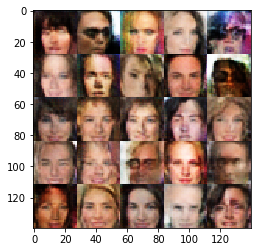

Epoch 1/1... Step 3450/6331... Discriminator Loss: 1.4587... Generator Loss: 0.5982


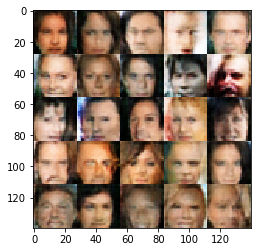

Epoch 1/1... Step 3500/6331... Discriminator Loss: 1.4637... Generator Loss: 0.6238


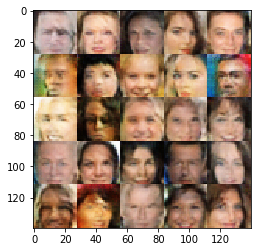

Epoch 1/1... Step 3550/6331... Discriminator Loss: 1.3404... Generator Loss: 0.6350


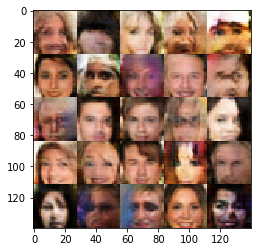

Epoch 1/1... Step 3600/6331... Discriminator Loss: 1.4826... Generator Loss: 0.5414


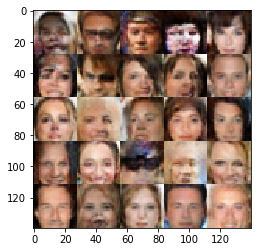

Epoch 1/1... Step 3650/6331... Discriminator Loss: 1.2565... Generator Loss: 0.7710


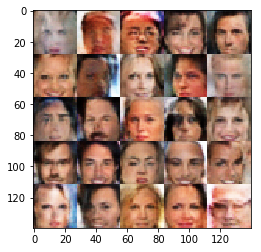

Epoch 1/1... Step 3700/6331... Discriminator Loss: 1.4297... Generator Loss: 0.6356


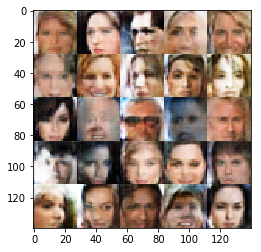

Epoch 1/1... Step 3750/6331... Discriminator Loss: 1.3987... Generator Loss: 0.6274


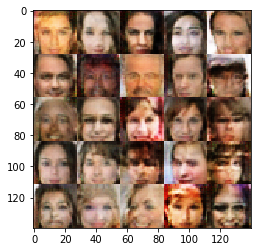

Epoch 1/1... Step 3800/6331... Discriminator Loss: 1.0413... Generator Loss: 1.0184


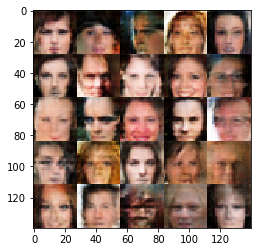

Epoch 1/1... Step 3850/6331... Discriminator Loss: 1.0065... Generator Loss: 0.9908


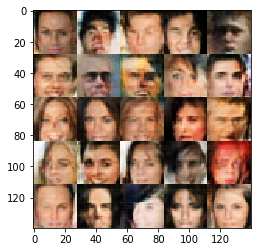

Epoch 1/1... Step 3900/6331... Discriminator Loss: 1.3557... Generator Loss: 0.6493


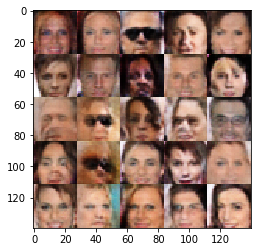

Epoch 1/1... Step 3950/6331... Discriminator Loss: 1.2954... Generator Loss: 0.6585


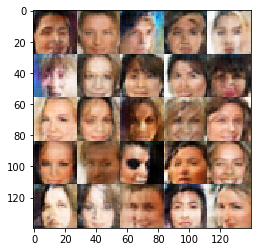

Epoch 1/1... Step 4000/6331... Discriminator Loss: 1.4111... Generator Loss: 0.5789


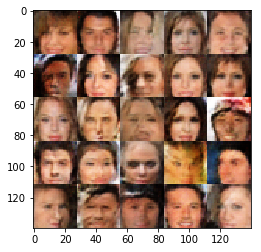

Epoch 1/1... Step 4050/6331... Discriminator Loss: 1.3805... Generator Loss: 0.6628


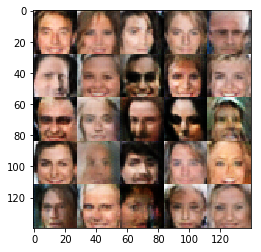

Epoch 1/1... Step 4100/6331... Discriminator Loss: 1.1945... Generator Loss: 0.8069


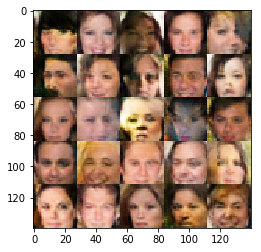

Epoch 1/1... Step 4150/6331... Discriminator Loss: 1.4220... Generator Loss: 0.5019


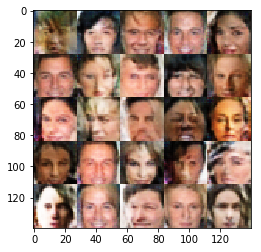

Epoch 1/1... Step 4200/6331... Discriminator Loss: 1.1263... Generator Loss: 0.7018


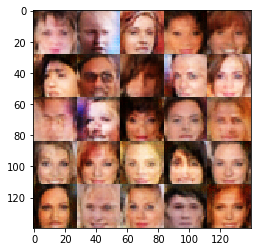

Epoch 1/1... Step 4250/6331... Discriminator Loss: 1.0723... Generator Loss: 0.9329


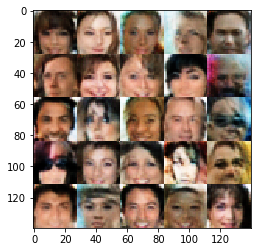

Epoch 1/1... Step 4300/6331... Discriminator Loss: 1.3463... Generator Loss: 0.5800


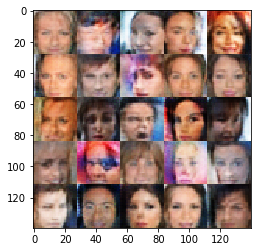

Epoch 1/1... Step 4350/6331... Discriminator Loss: 1.3979... Generator Loss: 0.5708


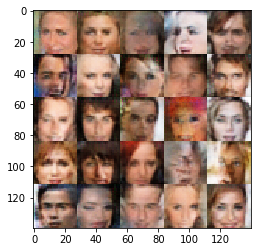

Epoch 1/1... Step 4400/6331... Discriminator Loss: 1.4163... Generator Loss: 0.6041


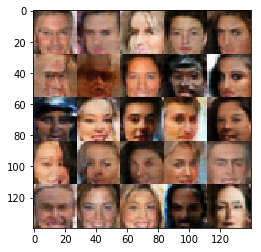

Epoch 1/1... Step 4450/6331... Discriminator Loss: 1.4096... Generator Loss: 0.6853


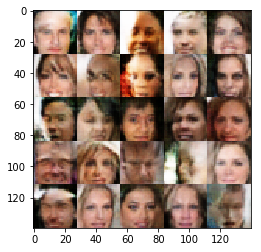

Epoch 1/1... Step 4500/6331... Discriminator Loss: 1.2093... Generator Loss: 0.7502


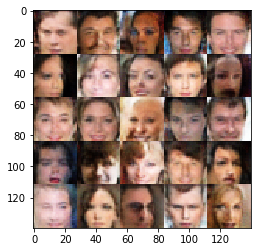

Epoch 1/1... Step 4550/6331... Discriminator Loss: 1.1938... Generator Loss: 0.7478


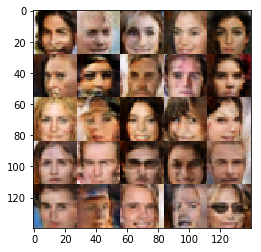

Epoch 1/1... Step 4600/6331... Discriminator Loss: 1.2765... Generator Loss: 0.6758


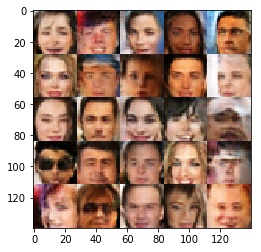

Epoch 1/1... Step 4650/6331... Discriminator Loss: 1.3894... Generator Loss: 0.6263


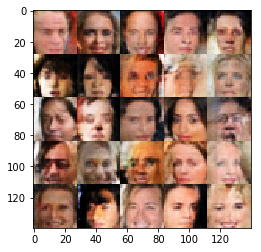

Epoch 1/1... Step 4700/6331... Discriminator Loss: 1.2963... Generator Loss: 0.6147


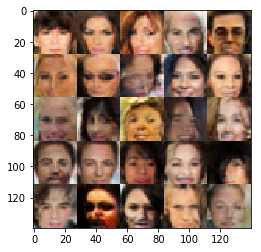

Epoch 1/1... Step 4750/6331... Discriminator Loss: 1.5123... Generator Loss: 0.5254


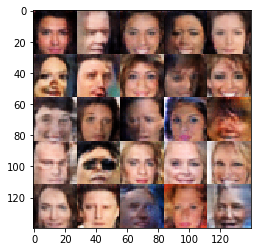

Epoch 1/1... Step 4800/6331... Discriminator Loss: 1.6666... Generator Loss: 0.4312


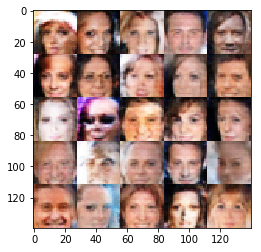

Epoch 1/1... Step 4850/6331... Discriminator Loss: 1.4152... Generator Loss: 0.5051


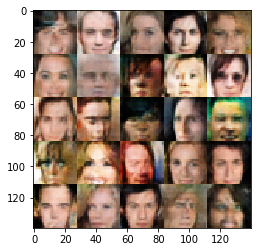

Epoch 1/1... Step 4900/6331... Discriminator Loss: 1.7197... Generator Loss: 0.4162


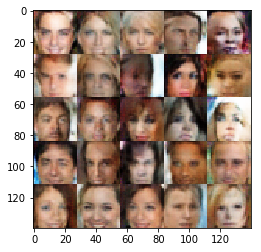

Epoch 1/1... Step 4950/6331... Discriminator Loss: 1.4475... Generator Loss: 0.5666


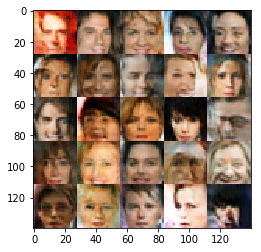

Epoch 1/1... Step 5000/6331... Discriminator Loss: 1.6580... Generator Loss: 0.5001


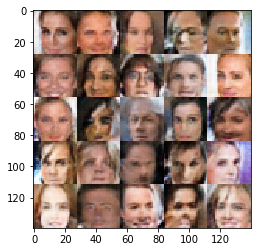

Epoch 1/1... Step 5050/6331... Discriminator Loss: 1.4745... Generator Loss: 0.5627


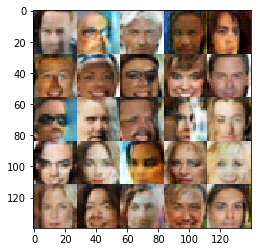

Epoch 1/1... Step 5100/6331... Discriminator Loss: 1.3655... Generator Loss: 0.5828


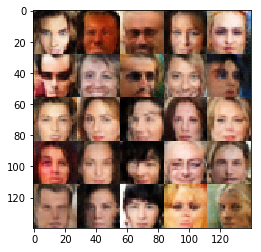

Epoch 1/1... Step 5150/6331... Discriminator Loss: 1.3432... Generator Loss: 0.6832


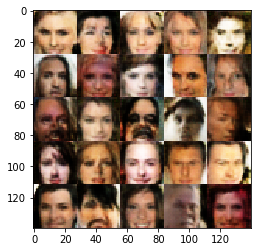

Epoch 1/1... Step 5200/6331... Discriminator Loss: 1.4328... Generator Loss: 0.5575


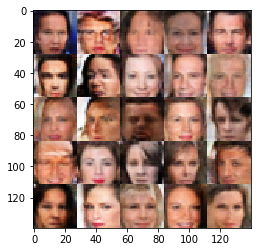

Epoch 1/1... Step 5250/6331... Discriminator Loss: 1.1684... Generator Loss: 0.7976


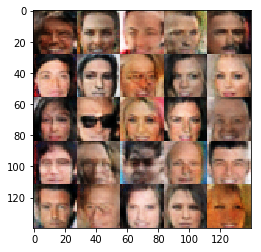

Epoch 1/1... Step 5300/6331... Discriminator Loss: 1.2978... Generator Loss: 0.7850


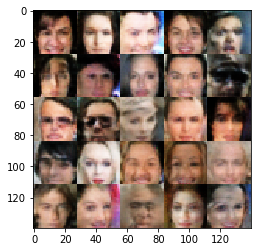

Epoch 1/1... Step 5350/6331... Discriminator Loss: 1.1187... Generator Loss: 0.8646


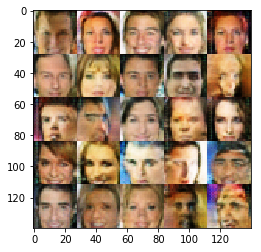

Epoch 1/1... Step 5400/6331... Discriminator Loss: 1.5158... Generator Loss: 0.4739


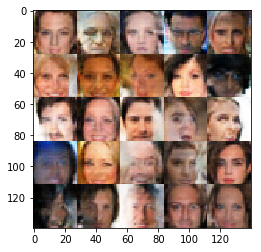

Epoch 1/1... Step 5450/6331... Discriminator Loss: 1.2982... Generator Loss: 0.6290


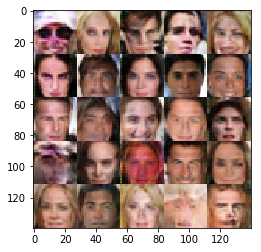

Epoch 1/1... Step 5500/6331... Discriminator Loss: 1.4025... Generator Loss: 0.5931


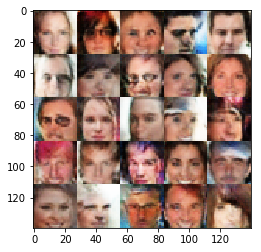

Epoch 1/1... Step 5550/6331... Discriminator Loss: 1.3720... Generator Loss: 0.6152


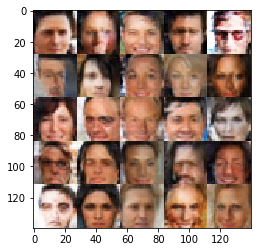

Epoch 1/1... Step 5600/6331... Discriminator Loss: 1.2816... Generator Loss: 0.6890


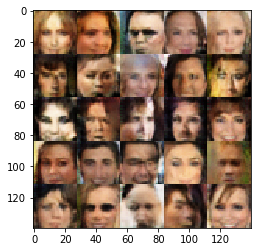

Epoch 1/1... Step 5650/6331... Discriminator Loss: 1.4466... Generator Loss: 0.5723


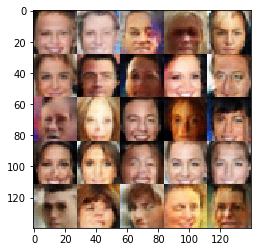

Epoch 1/1... Step 5700/6331... Discriminator Loss: 1.2779... Generator Loss: 0.6852


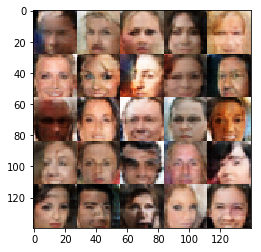

Epoch 1/1... Step 5750/6331... Discriminator Loss: 1.4474... Generator Loss: 0.5578


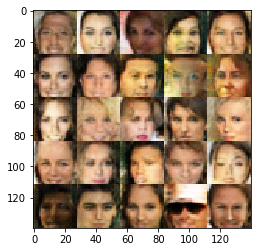

Epoch 1/1... Step 5800/6331... Discriminator Loss: 1.5938... Generator Loss: 0.4435


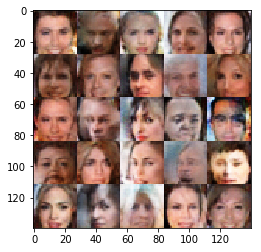

Epoch 1/1... Step 5850/6331... Discriminator Loss: 1.2520... Generator Loss: 0.6881


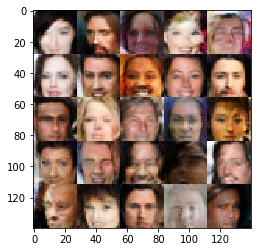

Epoch 1/1... Step 5900/6331... Discriminator Loss: 1.3085... Generator Loss: 0.6960


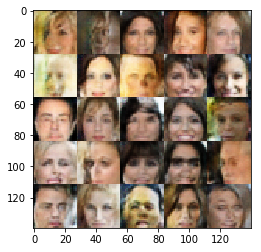

Epoch 1/1... Step 5950/6331... Discriminator Loss: 1.5894... Generator Loss: 0.4590


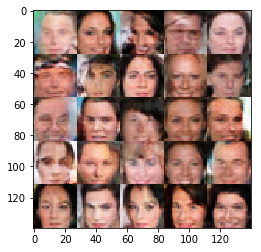

Epoch 1/1... Step 6000/6331... Discriminator Loss: 1.4931... Generator Loss: 0.5145


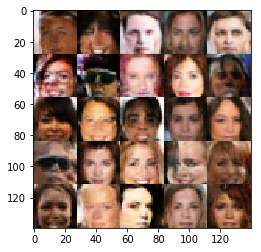

Epoch 1/1... Step 6050/6331... Discriminator Loss: 1.4218... Generator Loss: 0.6984


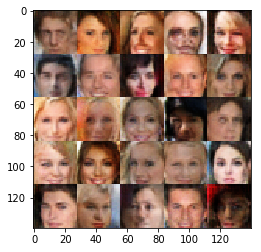

Epoch 1/1... Step 6100/6331... Discriminator Loss: 1.2910... Generator Loss: 0.6716


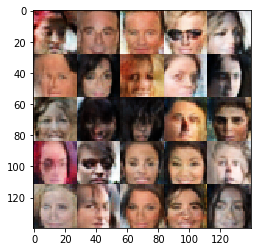

Epoch 1/1... Step 6150/6331... Discriminator Loss: 1.3176... Generator Loss: 0.7032


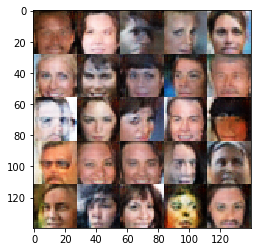

Epoch 1/1... Step 6200/6331... Discriminator Loss: 1.5576... Generator Loss: 0.4412


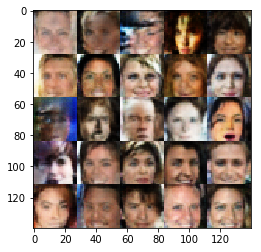

Epoch 1/1... Step 6250/6331... Discriminator Loss: 1.6540... Generator Loss: 0.4859


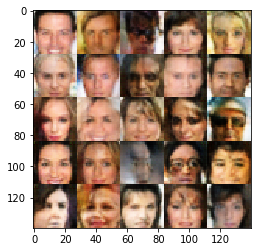

Epoch 1/1... Step 6300/6331... Discriminator Loss: 1.6122... Generator Loss: 0.4688


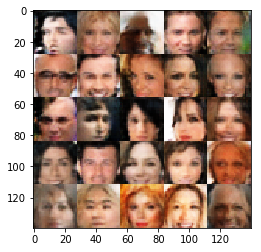

In [22]:
batch_size = 32
z_dim = 100
learning_rate = 0.0003
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.